# NPR and FFT(NPR) analysis on Tiny-GenImage

Notebook Kaggle này hiển thị tuần tự **ảnh gốc → NPR residual → FFT của NPR residual** cho ảnh real và fake của từng generator.

NPR dùng đúng công thức trong baseline `NPRResNet18` của dự án:

```text
x = ImageNetNormalize(ToTensor(resized_image))
down = nearest_interpolate(x, scale_factor=0.5)
up = nearest_interpolate(down, size=x.shape[-2:])
NPR(x) = (x - up) * (2/3)
```

FFT(NPR) được tính riêng trên ba kênh NPR, sau đó cộng power của ba kênh. Hình NPR dùng RMS magnitude để dễ nhìn; FFT dùng log10 normalized power với một color scale chung cho toàn bộ ảnh được so sánh.

In [4]:
from pathlib import Path
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn.functional as F

# Kaggle dataset: https://www.kaggle.com/datasets/yangsangtai/tiny-genimage
# Hai path dưới đây bao phủ cả mount kiểu mới và kiểu phổ biến của Kaggle.
DATA_ROOT_CANDIDATES = [
    Path("/kaggle/input/datasets/yangsangtai/tiny-genimage"),
    Path("/kaggle/input/tiny-genimage"),
]

RANDOM_SEED = 42
IMAGE_SIZE = 256
NUM_VISUAL_PER_GENERATOR = 2
NUM_VISUAL_PAIRS = 14
MAX_STATS_PER_GROUP = 100
RADIAL_BINS = 96
HIGH_FREQUENCY_CUTOFF = 0.5

NPR_FACTOR = 0.5
NPR_SCALE = 2.0 / 3.0
IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
IMAGENET_STD = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
rng = random.Random(RANDOM_SEED)


def get_image_paths(folder: Path) -> list[Path]:
    if not folder.exists():
        return []
    return sorted(
        path for path in folder.rglob("*")
        if path.is_file() and path.suffix.lower() in IMAGE_EXTENSIONS
    )


def is_generator_dir(path: Path) -> bool:
    return (
        path.is_dir()
        and (path / "val" / "nature").exists()
        and (path / "val" / "ai").exists()
    )


def find_data_root() -> Path:
    for candidate in DATA_ROOT_CANDIDATES:
        if candidate.exists() and any(is_generator_dir(path) for path in candidate.iterdir()):
            return candidate

    kaggle_input = Path("/kaggle/input")
    if kaggle_input.exists():
        for candidate in kaggle_input.rglob("*"):
            if candidate.is_dir() and any(is_generator_dir(path) for path in candidate.iterdir()):
                return candidate

    raise FileNotFoundError(
        "Cannot find Tiny-GenImage. Attach yangsangtai/tiny-genimage to this "
        "Kaggle notebook or add its mounted path to DATA_ROOT_CANDIDATES."
    )


DATA_ROOT = find_data_root()
print("Dataset root:", DATA_ROOT)

generator_dirs = sorted(
    (path for path in DATA_ROOT.iterdir() if is_generator_dir(path)),
    key=lambda path: path.name,
)

print("Generators found:", len(generator_dirs))
for generator_dir in generator_dirs:
    real_count = len(get_image_paths(generator_dir / "val" / "nature"))
    fake_count = len(get_image_paths(generator_dir / "val" / "ai"))
    print(f"{generator_dir.name}: real={real_count}, fake={fake_count}")

Dataset root: /kaggle/input/datasets/yangsangtai/tiny-genimage
Generators found: 7
imagenet_ai_0419_biggan: real=500, fake=500
imagenet_ai_0419_vqdm: real=500, fake=500
imagenet_ai_0424_sdv5: real=500, fake=500
imagenet_ai_0424_wukong: real=500, fake=500
imagenet_ai_0508_adm: real=500, fake=500
imagenet_glide: real=500, fake=500
imagenet_midjourney: real=500, fake=500


In [5]:
def sample_paths(paths: list[Path], count: int) -> list[Path]:
    if len(paths) <= count:
        return list(paths)
    return rng.sample(paths, count)


visual_pairs = []
for generator_dir in generator_dirs:
    real_paths = get_image_paths(generator_dir / "val" / "nature")
    fake_paths = get_image_paths(generator_dir / "val" / "ai")
    pair_count = min(NUM_VISUAL_PER_GENERATOR, len(real_paths), len(fake_paths))

    selected_real = sample_paths(real_paths, pair_count)
    selected_fake = sample_paths(fake_paths, pair_count)
    for real_path, fake_path in zip(selected_real, selected_fake):
        visual_pairs.append(
            {
                "source": generator_dir.name,
                "real_path": real_path,
                "fake_path": fake_path,
            }
        )

rng.shuffle(visual_pairs)
visual_pairs = visual_pairs[:NUM_VISUAL_PAIRS]
print("Balanced visual pairs:", len(visual_pairs))

Balanced visual pairs: 14


## NPR transform and FFT(NPR)

`compute_npr_residual` tái hiện đúng preprocessing và NPR front-end của baseline. FFT không chạy trên ảnh RGB gốc mà chạy trên tensor residual ba kênh NPR.

In [6]:
def center_crop_square(image: Image.Image) -> Image.Image:
    width, height = image.size
    side = min(width, height)
    left = (width - side) // 2
    top = (height - side) // 2
    return image.crop((left, top, left + side, top + side))


def load_standardized_image(image_path: Path, image_size: int = IMAGE_SIZE):
    image = Image.open(image_path).convert("RGB")
    original_size = image.size
    image = center_crop_square(image)
    image = image.resize((image_size, image_size), Image.Resampling.BILINEAR)

    rgb = np.asarray(image, dtype=np.float32) / 255.0
    tensor = torch.from_numpy(rgb).permute(2, 0, 1)
    normalized = (tensor - IMAGENET_MEAN) / IMAGENET_STD
    return rgb, normalized, original_size


def compute_npr_residual(normalized_image: torch.Tensor) -> torch.Tensor:
    # Same formula as baselines/npr_resnet18/npr_resnet18.py::NPRLayer.
    x = normalized_image.unsqueeze(0)
    _, _, height, width = x.shape
    if height % 2 == 1:
        x = x[:, :, :-1, :]
    if width % 2 == 1:
        x = x[:, :, :, :-1]

    down = F.interpolate(
        x,
        scale_factor=NPR_FACTOR,
        mode="nearest",
        recompute_scale_factor=True,
    )
    up = F.interpolate(down, size=x.shape[-2:], mode="nearest")
    return ((x - up) * NPR_SCALE).squeeze(0)


def npr_magnitude_for_display(npr: torch.Tensor) -> np.ndarray:
    # RMS across the three signed NPR channels. Display-only representation.
    return torch.sqrt(torch.mean(npr.float() ** 2, dim=0)).cpu().numpy()


def compute_npr_psd(npr: torch.Tensor):
    residual = npr.detach().cpu().numpy().astype(np.float64)
    channels, height, width = residual.shape

    # Apply the same 2D Hann window to every NPR channel.
    window = np.outer(np.hanning(height), np.hanning(width)).astype(np.float64)
    windowed = residual * window[None, :, :]

    spectrum = np.fft.fftshift(
        np.fft.fft2(windowed, axes=(-2, -1)),
        axes=(-2, -1),
    )
    # Sum channel power because the NPR-ResNet consumes all three channels.
    psd = np.sum(np.abs(spectrum) ** 2, axis=0)
    psd = psd / (psd.sum() + np.finfo(np.float64).eps)
    log_psd = np.log10(psd + 1e-12)
    return psd, log_psd


def normalized_radius_grid(shape: tuple[int, int]) -> np.ndarray:
    height, width = shape
    yy, xx = np.indices((height, width))
    cy, cx = height // 2, width // 2
    return np.sqrt((yy - cy) ** 2 + (xx - cx) ** 2) / (min(height, width) / 2.0)


def radial_mean_psd(psd: np.ndarray, bins: int = RADIAL_BINS):
    radius = normalized_radius_grid(psd.shape)
    edges = np.linspace(0.0, 1.0, bins + 1)
    centers = 0.5 * (edges[:-1] + edges[1:])
    profile = np.full(bins, np.nan, dtype=np.float64)

    for index in range(bins):
        mask = (radius >= edges[index]) & (radius < edges[index + 1])
        if np.any(mask):
            profile[index] = float(psd[mask].mean())

    profile = profile / (np.nansum(profile) + np.finfo(np.float64).eps)
    return centers, profile


def frequency_region_metrics(psd: np.ndarray, cutoff: float = HIGH_FREQUENCY_CUTOFF) -> dict:
    radius = normalized_radius_grid(psd.shape)
    valid_mask = radius <= 1.0
    high_mask = (radius >= cutoff) & valid_mask

    valid_energy = psd[valid_mask]
    total_energy = float(valid_energy.sum())
    probability = valid_energy / (total_energy + np.finfo(np.float64).eps)

    entropy = -float(np.sum(probability * np.log(probability + 1e-12)))
    return {
        "high_frequency_energy_ratio": float(
            psd[high_mask].sum() / (total_energy + np.finfo(np.float64).eps)
        ),
        "spectral_energy_entropy_normalized": float(
            entropy / np.log(max(probability.size, 2))
        ),
    }

## Visual comparison: original → NPR → FFT(NPR)

Mỗi hàng là một cặp real/fake thuộc cùng generator. NPR magnitude và FFT(NPR) dùng color scale chung giữa tất cả ảnh trong figure để tránh auto-scaling gây hiểu nhầm.

/tmp/ipykernel_58/3391597141.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


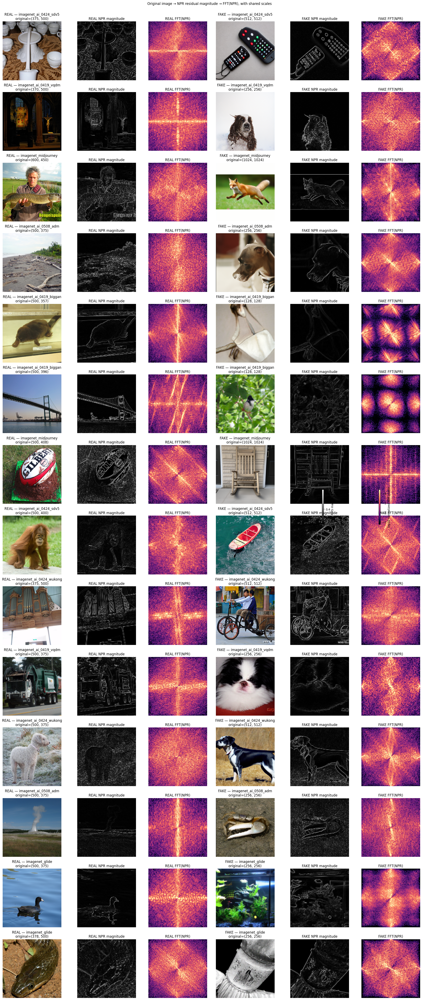

In [7]:
visual_rows = []
all_npr_magnitudes = []
all_log_psd = []

for pair in visual_pairs:
    row = {"source": pair["source"]}
    for label_name in ["real", "fake"]:
        rgb, normalized, original_size = load_standardized_image(pair[f"{label_name}_path"])
        npr = compute_npr_residual(normalized)
        npr_magnitude = npr_magnitude_for_display(npr)
        _, log_psd = compute_npr_psd(npr)

        row[f"{label_name}_rgb"] = rgb
        row[f"{label_name}_npr"] = npr_magnitude
        row[f"{label_name}_log_psd"] = log_psd
        row[f"{label_name}_original_size"] = original_size
        all_npr_magnitudes.append(npr_magnitude)
        all_log_psd.append(log_psd)
    visual_rows.append(row)

npr_vmin = 0.0
npr_vmax = float(np.percentile(np.stack(all_npr_magnitudes), 99.5))
fft_vmin, fft_vmax = np.percentile(np.stack(all_log_psd), [2.0, 99.5])

fig, axes = plt.subplots(
    len(visual_rows),
    6,
    figsize=(21, max(4, len(visual_rows) * 3.5)),
    squeeze=False,
)

for row_index, row in enumerate(visual_rows):
    source = row["source"]
    columns = [("real", 0), ("fake", 3)]
    for label_name, start_column in columns:
        display_name = label_name.upper()
        axes[row_index, start_column].imshow(row[f"{label_name}_rgb"])
        axes[row_index, start_column].set_title(
            f"{display_name} — {source}\noriginal={row[f'{label_name}_original_size']}"
        )

        axes[row_index, start_column + 1].imshow(
            row[f"{label_name}_npr"],
            cmap="gray",
            vmin=npr_vmin,
            vmax=npr_vmax,
        )
        axes[row_index, start_column + 1].set_title(f"{display_name} NPR magnitude")

        axes[row_index, start_column + 2].imshow(
            row[f"{label_name}_log_psd"],
            cmap="magma",
            vmin=fft_vmin,
            vmax=fft_vmax,
        )
        axes[row_index, start_column + 2].set_title(f"{display_name} FFT(NPR)")

    for column_index in range(6):
        axes[row_index, column_index].axis("off")

npr_colorbar = fig.colorbar(
    axes[0, 1].images[0],
    ax=axes[:, [1, 4]].ravel().tolist(),
    fraction=0.008,
    pad=0.01,
)
npr_colorbar.set_label("NPR RMS magnitude")

fft_colorbar = fig.colorbar(
    axes[0, 2].images[0],
    ax=axes[:, [2, 5]].ravel().tolist(),
    fraction=0.008,
    pad=0.01,
)
fft_colorbar.set_label("log10 normalized NPR power")

fig.suptitle(
    "Original image → NPR residual magnitude → FFT(NPR), with shared scales",
    y=1.001,
)
plt.tight_layout()
plt.show()

## Aggregate FFT(NPR) statistics

Bảng dùng tổng energy thật sự trên FFT(NPR), không cộng các radial-bin mean để gọi là energy ratio. Đường radial bên dưới vẫn dùng mean per coefficient vì mục tiêu của nó là so sánh hình dạng phổ theo bán kính.

Images analyzed for FFT(NPR): 1400


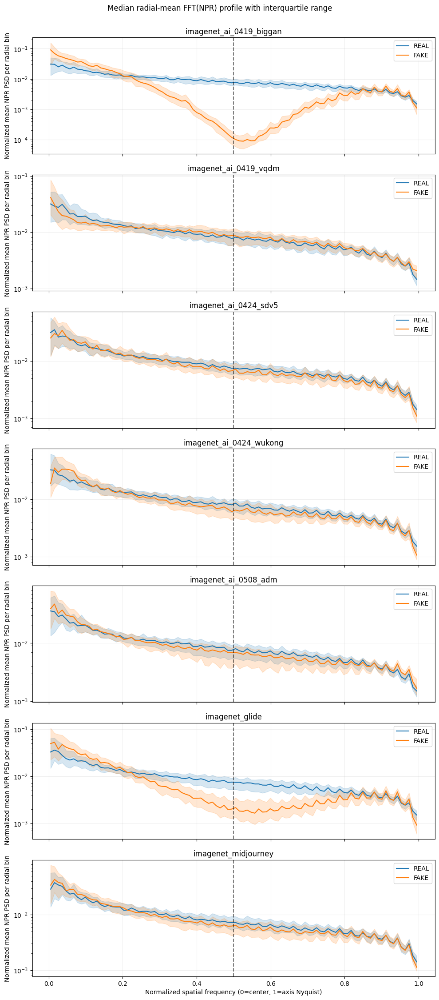

high_frequency_energy_ratio                      \
                                                    count    median      mean   
source                  label                                                   
imagenet_ai_0419_biggan fake                          100  0.498789  0.500898   
                        real                          100  0.577960  0.575858   
imagenet_ai_0419_vqdm   fake                          100  0.585253  0.579767   
                        real                          100  0.574965  0.574165   
imagenet_ai_0424_sdv5   fake                          100  0.559045  0.561613   
                        real                          100  0.578236  0.579358   
imagenet_ai_0424_wukong fake                          100  0.561979  0.566353   
                        real                          100  0.574816  0.579177   
imagenet_ai_0508_adm    fake                          100  0.568596  0.566091   
                        real                          100  0.565601  0.572606   
imagenet_glide          fake                          100  0.513182  0.518644   
                        real                          100  0.567536  0.568028   
imagenet_midjourney     fake                          100  0.552330  0.563115   
                        real                          100  0.569544  0.569936   

                                        high_frequency_radial_density_ratio  \
                                    std                               count   
source                  label                                                 
imagenet_ai_0419_biggan fake   0.047373                                 100   
                        real   0.039133                                 100   
imagenet_ai_0419_vqdm   fake   0.042737                                 100   
                        real   0.039028                                 100   
imagenet_ai_0424_sdv5   fake   0.035076                                 100   
                        real   0.034550                                 100   
imagenet_ai_0424_wukong fake   0.041814                                 100   
                        real   0.034359                                 100   
imagenet_ai_0508_adm    fake   0.041172                                 100   
                        real   0.038789                                 100   
imagenet_glide          fake   0.037046                                 100   
                        real   0.036422                                 100   
imagenet_midjourney     fake   0.040640                                 100   
                        real   0.035683                                 100   

                                                             \
                                 median      mean       std   
source                  label                                 
imagenet_ai_0419_biggan fake   0.099035  0.104235  0.040715   
                        real   0.260877  0.263073  0.073008   
imagenet_ai_0419_vqdm   fake   0.276461  0.273861  0.084209   
                        real   0.270270  0.263386  0.068011   
imagenet_ai_0424_sdv5   fake   0.250405  0.244912  0.061432   
                        real   0.265983  0.264821  0.056170   
imagenet_ai_0424_wukong fake   0.233935  0.242965  0.070040   
                        real   0.266895  0.263971  0.061447   
imagenet_ai_0508_adm    fake   0.237685  0.225628  0.075039   
                        real   0.260332  0.252013  0.070053   
imagenet_glide          fake   0.147013  0.151266  0.054254   
                        real   0.248840  0.247396  0.069486   
imagenet_midjourney     fake   0.223578  0.227197  0.065207   
                        real   0.244346  0.247062  0.060180   

                              spectral_energy_entropy_normalized            \
                                                           count    median   
source                  label                                                
im

In [8]:
profile_rows = []

for generator_dir in generator_dirs:
    source = generator_dir.name
    for label_name, folder_name in [("real", "nature"), ("fake", "ai")]:
        paths = get_image_paths(generator_dir / "val" / folder_name)
        selected_paths = sample_paths(paths, min(MAX_STATS_PER_GROUP, len(paths)))

        for image_path in selected_paths:
            _, normalized, original_size = load_standardized_image(image_path)
            npr = compute_npr_residual(normalized)
            psd, _ = compute_npr_psd(npr)
            radii, profile = radial_mean_psd(psd)
            metrics = frequency_region_metrics(psd)

            valid = np.isfinite(profile) & (profile > 0)
            radial_probability = profile[valid] / profile[valid].sum()
            metrics["high_frequency_radial_density_ratio"] = float(
                np.nansum(profile[radii >= HIGH_FREQUENCY_CUTOFF])
            )
            metrics["radial_profile_entropy"] = -float(
                np.sum(radial_probability * np.log(radial_probability + 1e-12))
            )

            profile_rows.append(
                {
                    "source": source,
                    "label": label_name,
                    "path": str(image_path),
                    "original_width": original_size[0],
                    "original_height": original_size[1],
                    "radii": radii,
                    "profile": profile,
                    **metrics,
                }
            )

print("Images analyzed for FFT(NPR):", len(profile_rows))

fig, axes = plt.subplots(
    len(generator_dirs),
    1,
    figsize=(10, max(4, 3.2 * len(generator_dirs))),
    sharex=True,
    squeeze=False,
)
colors = {"real": "tab:blue", "fake": "tab:orange"}

for axis, generator_dir in zip(axes[:, 0], generator_dirs):
    source = generator_dir.name
    for label_name in ["real", "fake"]:
        selected = [
            row["profile"]
            for row in profile_rows
            if row["source"] == source and row["label"] == label_name
        ]
        profiles = np.stack(selected)
        median = np.nanmedian(profiles, axis=0)
        q25 = np.nanpercentile(profiles, 25, axis=0)
        q75 = np.nanpercentile(profiles, 75, axis=0)
        axis.plot(radii, median, label=label_name.upper(), color=colors[label_name])
        axis.fill_between(radii, q25, q75, color=colors[label_name], alpha=0.18)

    axis.axvline(HIGH_FREQUENCY_CUTOFF, color="black", linestyle="--", alpha=0.5)
    axis.set_yscale("log")
    axis.set_ylabel("Normalized mean NPR PSD per radial bin")
    axis.set_title(source)
    axis.grid(alpha=0.2)
    axis.legend()

axes[-1, 0].set_xlabel("Normalized spatial frequency (0=center, 1=axis Nyquist)")
fig.suptitle("Median radial-mean FFT(NPR) profile with interquartile range", y=1.002)
plt.tight_layout()
plt.show()

metric_df = pd.DataFrame(
    {key: value for key, value in row.items() if key not in {"radii", "profile"}}
    for row in profile_rows
)

summary_df = (
    metric_df.groupby(["source", "label"])[
        [
            "high_frequency_energy_ratio",
            "high_frequency_radial_density_ratio",
            "spectral_energy_entropy_normalized",
            "radial_profile_entropy",
        ]
    ]
    .agg(["count", "median", "mean", "std"])
    .round(6)
)

display(summary_df)

## Cách đọc kết quả

- NPR magnitude chỉ là biểu diễn để nhìn residual; NPR-ResNet thực tế nhận đủ ba kênh signed residual.
- FFT(NPR) được tính bằng tổng channel power, nên không làm mất một kênh NPR trước khi phân tích.
- `high_frequency_energy_ratio` là tỷ lệ tổng energy thật sự trong vùng `0.5 <= r <= 1.0`.
- `high_frequency_radial_density_ratio` mô tả shape của radial-mean profile và không phải phần trăm tổng energy.
- Chênh lệch real/fake chỉ là ứng viên forensic nếu lặp lại trên nhiều ảnh, tổng quát sang generator chưa thấy và bền vững sau JPEG/resize.
- Center crop, resize và ImageNet normalization là một phần của phép đo; cần ghi rõ preprocessing này trong báo cáo.